# 1. 외부 Module import

>모델 학습에 사용할 모듈을 설치 후 import

In [2]:
from torch.utils.data import TensorDataset
import numpy as np
from numpy import concatenate
from numpy import loadtxt
import pandas as pd
from pandas import read_csv,DataFrame,concat
from pandas.plotting import register_matplotlib_converters
from math import sqrt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset,random_split,DistributedSampler,DataLoader

import random,os,copy
import pickle
from tqdm import tqdm
from collections import Counter

from sklearn.metrics import mean_absolute_error,mean_squared_error,mean_squared_log_error,r2_score,roc_auc_score,roc_curve
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler,LabelEncoder

import matplotlib.pyplot as plt
from pylab import rcParams
from matplotlib import pyplot
from matplotlib import rc
import seaborn as sns

In [3]:
print("np",np.__version__)
print("pd",pd.__version__)
print("torch",torch.__version__)

np 1.22.3
pd 1.4.2
torch 1.11.0+cu113


# 2. 모델 학습 및 테스트에 필요한 데이터 불러오기

## 2-1. 최종 데이터셋 불러오기

In [4]:
final=pd.read_csv('final.csv')

In [5]:
final.columns

Index(['Unnamed: 0', 'walk', 'exer', 'sleep', 'sleepProblem', 'dream',
       'amCondition', 'amEmotion', 'pmEmotion', 'pmStress', 'caffeine',
       'alcohol', 'gender', 'age', 'e4Bvp', 'e4Eda', 'e4Hr', 'e4Temp',
       'gps_activity_distance'],
      dtype='object')

In [6]:
final=final.dropna(axis=0)

## 2-2. 수면관련 output 설정

### '수면 만족도 (sleep)', '수면의 질 (sleepProblem)','악몽 여부 (dream)', '수면 이후 주관적 신체상태 (amCondition)', '수면 이후 주관적 감정상태 (amEmotion)'

# 3. 모델 학습 및 테스트

## 3-1. 수면 만족도 (sleep)

In [7]:
final=final.reset_index(drop=True)

In [649]:
user01=features[features['userId']=='user01']

In [8]:
feature=final[['walk', 'exer', 'pmEmotion', 'pmStress', 'caffeine', 'alcohol', 'gender', 'age',\
                       'e4Bvp','e4Eda','e4Hr','e4Temp','gps_activity_distance']]

In [667]:
final['sleep'].value_counts()

4.0    441
3.0    312
2.0    200
5.0     82
1.0     34
Name: sleep, dtype: int64

In [668]:
sleep=final['sleep'].apply(lambda x: 0 if x==1 or x==2 else 1)

In [669]:
final['sleep'].value_counts()

4.0    441
3.0    312
2.0    200
5.0     82
1.0     34
Name: sleep, dtype: int64

In [670]:
sleep.value_counts()

1    835
0    234
Name: sleep, dtype: int64

In [671]:
sleep=sleep.reset_index(drop=True)

In [672]:
feature

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
0,45,0,4.0,4.0,1,1,1,27,-0.013653,3.103176,86.727616,33.021747,0.000000
1,30,0,5.0,4.0,1,1,1,27,0.056283,2.503302,87.789920,34.441982,0.000000
2,20,0,5.0,2.0,1,1,1,27,0.036912,3.373406,85.270147,33.193400,0.000000
3,20,0,3.0,2.0,0,0,1,27,0.009140,1.663482,89.475536,34.086428,0.000000
4,35,0,4.0,4.0,1,1,1,27,-0.004555,0.773490,88.103819,34.190778,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,81,4,3.0,2.0,0,0,1,24,0.000718,0.120715,88.643042,35.732362,0.000000
1065,89,0,3.0,2.0,0,0,1,24,-0.002291,0.206694,78.212777,35.668583,0.000000
1066,140,0,3.0,3.0,1,0,1,24,0.000417,0.693704,84.231193,35.719695,0.000000
1067,17,0,3.0,3.0,1,0,1,24,-0.007869,0.430001,82.935526,35.455277,166.408832


In [726]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

train_features, test_features, train_labels, test_labels= train_test_split(feature,sleep,stratify=sleep, test_size=0.2, shuffle=True)

In [727]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [728]:
train_features=pd.DataFrame(train_features, columns=feature.columns)

In [729]:
test_features=pd.DataFrame(test_features, columns=feature.columns)

In [730]:
train_features.agg(['mean','std']).round(2)

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
mean,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [731]:
lr = LogisticRegression()
lr.fit(train_features, train_labels)

LogisticRegression()

In [741]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold

param_grid = {
    'C': np.logspace(-3, 3, 7),  # Regularization strength
    'penalty': ['l1', 'l2']      # Regularization type
}

# Create a k-fold cross-validation object with k=5
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(lr, param_grid, cv=kfold)

# Perform hyperparameter tuning with k-fold cross-validation on the training set
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(grid_search.best_params_)

# Train the model with the best hyperparameters on the entire training set
lr = grid_search.best_estimator_
lr.fit(test_features, test_labels)

# Evaluate the best model on the testing set
test_accuracy = lr.score(test_features, test_labels)
print(f"Testing Accuracy: {test_accuracy:.4f}")

Best Hyperparameters:
{'C': 0.001, 'penalty': 'l2'}
Testing Accuracy: 0.7804


C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
70 fits failed out of a total of 140.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
70 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueError: Sol

In [20]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, roc_curve, r2_score, accuracy_score, f1_score
from sklearn.metrics import recall_score, precision_score, confusion_matrix, classification_report, roc_auc_score, auc

In [743]:
print(lr.score(test_features, test_labels))

0.780373831775701


In [744]:
clf = DecisionTreeClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=kfold)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Decision Tree classifier with the best hyperparameters
dt = DecisionTreeClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
dt.fit(train_features, train_labels)

# Make predictions
y_pred = dt.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = dt.predict_proba(test_features)[:,1]
dt_fpr, dt_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.7710280373831776


In [746]:
clf = RandomForestClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'n_estimators': [10, 50, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=10)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
rf = RandomForestClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
rf.fit(train_features, train_labels)

# Make predictions
y_pred = rf.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = rf.predict_proba(test_features)[:,1]
rf_fpr, rf_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.8504672897196262


In [747]:
import xgboost as xgb

# Define the hyperparameter grid to search over
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.001],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0],
    'gamma': [0, 1, 2],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5],
}

# Create an instance of the XGBoost classifier
xgb_model = xgb.XGBClassifier()

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=10)

# Fit the grid search to the data
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters and corresponding accuracy
print("Best Hyperparameters: ", grid_search.best_params_)
print("Best Accuracy: ", grid_search.best_score_)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
xgb = xgb.XGBClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
xgb.fit(train_features, train_labels)

# Make predictions
y_pred = xgb.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = xgb.predict_proba(test_features)[:,1]
xgb_fpr, xgb_tpr, threshold1 = roc_curve(test_labels, probs)

Best Hyperparameters:  {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 0.5, 'subsample': 0.8}
Best Accuracy:  0.8280711354309165
Accuracy: 0.822429906542056


In [749]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier()

# Define hyperparameter grid for tuning
param_grid = {
    'boosting_type': ['gbdt', 'dart', 'goss'],
    'num_leaves': [31, 63],
    'max_depth': [-1, 5, 10],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'objective': ['binary'],
    'reg_alpha': [0.0, 0.1, 0.2],
    'reg_lambda': [0.0, 0.1, 0.2],
    'n_jobs': [-1],
    'silent': [True]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid, scoring='accuracy', cv=10)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Train the LightGBM classifier with the best hyperparameters
lgbm_best = LGBMClassifier(**best_params)
lgbm_best.fit(train_labels, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-pac

ValueError: Expected 2D array, got 1D array instead:
array=[1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0 0 1 0 0 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1
 1 1 1 1 1 0 0 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0
 0 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 0
 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 0 1 0 1 1 1 0 1 1
 0 1 0 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 0 1 1 1 1 1 1
 0 1 1 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0
 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 0
 1 0 1 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 0 0 0
 1 1 1 0 1 0 0 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 0 0 1 0 1 0 1 0 1 0 1 1 0 1 1 0 1 1
 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1
 1 1 1 0 1 1 0 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 0 1 1
 1 1 1 0 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0
 1 1 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 1 0 1
 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 0 1 0 1 1 1
 1 1 1 0 1 1 1 0 1 1 1 0 1 0 1 1 0 1 0 1 1 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 1 1 1 0
 1 0 1 1].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [753]:
lgbm_best.fit(train_features, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

probs = lgbm_best.predict_proba(test_features)[:,1]
lgbm_fpr, lgbm_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 84.11%


C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "


In [794]:
stacking_pred

array([1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], dtype=int64)

In [793]:
probs

array([0.95924906, 0.93564804, 0.25646566, 0.99094986, 0.87128606,
       0.96874236, 0.97702064, 0.99019274, 0.91494623, 0.39012982,
       0.06999261, 0.94314665, 0.82781167, 0.97326681, 0.98016794,
       0.98521892, 0.76296837, 0.9431974 , 0.89879247, 0.52173726,
       0.76942572, 0.34912373, 0.87606128, 0.93696986, 0.63629192,
       0.82136094, 0.83384831, 0.98240215, 0.94628343, 0.62367385,
       0.25152885, 0.94531185, 0.95523077, 0.99430253, 0.58648059,
       0.97360665, 0.76565319, 0.94618097, 0.11068171, 0.88494877,
       0.39196825, 0.9645753 , 0.99427579, 0.7620071 , 0.79813246,
       0.97213665, 0.97362734, 0.06999261, 0.95154111, 0.94743673,
       0.90855003, 0.90769343, 0.39644685, 0.94813763, 0.93166876,
       0.87819196, 0.99046815, 0.93337527, 0.98410621, 0.30738034,
       0.25646566, 0.46356979, 0.83030132, 0.092644  , 0.98604146,
       0.94314665, 0.97318523, 0.95356328, 0.91220138, 0.79896795,
       0.91488423, 0.98670387, 0.92828   , 0.97733059, 0.93067

In [827]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = lr.predict(train_features)
decision_tree_pred_train = dt.predict(train_features)
random_forest_pred_train = rf.predict(train_features)
xgboost_pred_train = xgb.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = logistic_regression.predict(test_features)
decision_tree_pred_test = decision_tree.predict(test_features)
random_forest_pred_test = random_forest.predict(test_features)
xgboost_pred_test = xgboost.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

logistic_regression_test = lr.predict(test_features)
decision_tree_test = dt.predict(test_features)
random_forest_test = rf.predict(test_features)
xgboost_test = xgb.predict(test_features)
lgbm_test = lgbm_best.predict(test_features)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

Accuracy of stacking ensemble: 88.79%


In [828]:
y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]

In [829]:
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

In [830]:
roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

0.89189705694993


[Text(0, 0.5, 'Sleep'), Text(0, 1.5, 'NoSleep')]

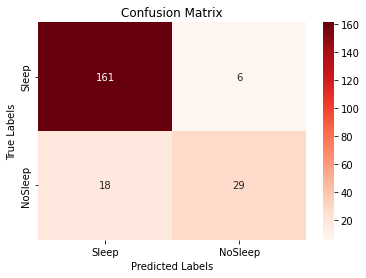

In [773]:
from sklearn.metrics import classification_report, confusion_matrix

cm=confusion_matrix(test_labels, stacking_pred, labels=[1,0])
ax=plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, cmap='Reds', fmt='d')
ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.xaxis.set_ticklabels(['Sleep','NoSleep'])
ax.yaxis.set_ticklabels(['Sleep','NoSleep'])

In [810]:
logistic_regression_test

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [815]:
# Initialize the meta model
meta_model1 = LogisticRegression()
meta_model2 = LogisticRegression()
meta_model3 = LogisticRegression()
meta_model4 = LogisticRegression()
meta_model5 = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = logistic_regression.predict(train_features)
decision_tree_pred_train = decision_tree.predict(train_features)
random_forest_pred_train = random_forest.predict(train_features)
xgboost_pred_train = xgboost.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X1 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train))

meta_train_X2 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 lgbm_pred_train))

meta_train_X3 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X4 = np.column_stack((logistic_regression_pred_train,
                                 
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X5 = np.column_stack((
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))


# Train the meta model on the meta-training dataset
meta_model1.fit(meta_train_X1, train_labels)
meta_model2.fit(meta_train_X2, train_labels)
meta_model3.fit(meta_train_X3, train_labels)
meta_model4.fit(meta_train_X4, train_labels)
meta_model5.fit(meta_train_X5, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = logistic_regression.predict(test_features)
decision_tree_pred_test = decision_tree.predict(test_features)
random_forest_pred_test = random_forest.predict(test_features)
xgboost_pred_test = xgboost.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X1 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test))

meta_test_X2 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                lgbm_pred_test))

meta_test_X3 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                               
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X4 = np.column_stack((logistic_regression_pred_test,
                                
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X5 = np.column_stack((
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred1 = meta_model1.predict(meta_test_X1)

stacking_pred2 = meta_model2.predict(meta_test_X2)

stacking_pred3 = meta_model3.predict(meta_test_X3)

stacking_pred4 = meta_model4.predict(meta_test_X4)

stacking_pred5 = meta_model5.predict(meta_test_X5)

# Calculate accuracy score of stacking ensemble
accuracy1 = accuracy_score(test_labels, stacking_pred1)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy1 * 100))

accuracy2 = accuracy_score(test_labels, stacking_pred2)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy2 * 100))

accuracy3 = accuracy_score(test_labels, stacking_pred3)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy3 * 100))

accuracy4 = accuracy_score(test_labels, stacking_pred4)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy4 * 100))

accuracy5 = accuracy_score(test_labels, stacking_pred5)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy5 * 100))

y_pred_meta1 = meta_model1.predict_proba(meta_test_X1)[:, 1]
mt_fpr1, mt_tpr1, threshold1 = roc_curve(test_labels, y_pred_meta1)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta2 = meta_model2.predict_proba(meta_test_X2)[:, 1]
mt_fpr2, mt_tpr2, threshold1 = roc_curve(test_labels, y_pred_meta2)

roc_auc = auc(mt_fpr2, mt_tpr2)
print(roc_auc)

y_pred_meta3 = meta_model3.predict_proba(meta_test_X3)[:, 1]
mt_fpr3, mt_tpr3, threshold1 = roc_curve(test_labels, y_pred_meta3)

roc_auc = auc(mt_fpr3, mt_tpr3)
print(roc_auc)

y_pred_meta4 = meta_model4.predict_proba(meta_test_X4)[:, 1]
mt_fpr4, mt_tpr4, threshold1 = roc_curve(test_labels, y_pred_meta4)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta5 = meta_model5.predict_proba(meta_test_X5)[:, 1]
mt_fpr5, mt_tpr5, threshold1 = roc_curve(test_labels, y_pred_meta5)

roc_auc = auc(mt_fpr5, mt_tpr5)
print(roc_auc)

Accuracy of stacking ensemble: 89.72%
Accuracy of stacking ensemble: 84.11%
Accuracy of stacking ensemble: 84.11%
Accuracy of stacking ensemble: 84.11%
Accuracy of stacking ensemble: 84.11%
0.8767995923047522
0.8638680086635241
0.8838068543763535
0.8767995923047522
0.8856542234679577


In [832]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
meta_model1_pred_train = meta_model1.predict(meta_train_X1)
meta_model2_pred_train = meta_model2.predict(meta_train_X2)
meta_model3_pred_train = meta_model3.predict(meta_train_X3)
meta_model4_pred_train = meta_model4.predict(meta_train_X4)
meta_model5_pred_train = meta_model5.predict(meta_train_X5)

# Create a meta-training dataset
meta_train_X = np.column_stack((meta_model1_pred_train,
                                 meta_model2_pred_train,
                                 meta_model3_pred_train,
                                 meta_model4_pred_train, meta_model5_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
meta_model1_pred_test = meta_model1.predict(meta_test_X1)
meta_model2_pred_test = meta_model2.predict(meta_test_X2)
meta_model3_pred_test = meta_model3.predict(meta_test_X3)
meta_model4_pred_test = meta_model4.predict(meta_test_X4)
meta_model5_pred_test = meta_model5.predict(meta_test_X5)

# Create a meta-testing dataset
meta_test_X = np.column_stack((meta_model1_pred_test,
                                meta_model2_pred_test,
                                meta_model3_pred_test,
                                meta_model4_pred_test, meta_model5_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

Accuracy of stacking ensemble: 84.11%
0.8311249840744044


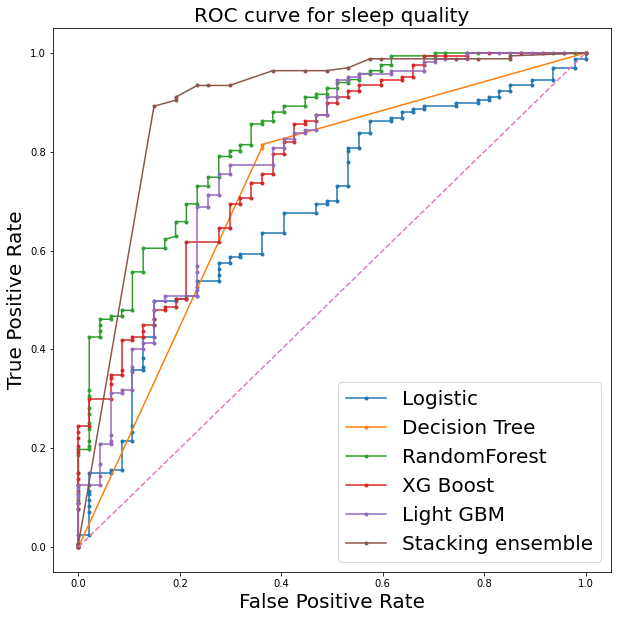

In [831]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(lr_fpr, lr_tpr, marker = '.', label = "Logistic")
plt.plot(dt_fpr, dt_tpr, marker = '.', label = "Decision Tree")
plt.plot(rf_fpr, rf_tpr, marker = '.', label = "RandomForest")
plt.plot(xgb_fpr, xgb_tpr, marker = '.', label = "XG Boost")
plt.plot(lgbm_fpr, lgbm_tpr, marker = '.', label = "Light GBM")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Stacking ensemble")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for sleep quality", size = 20)
plt.show()

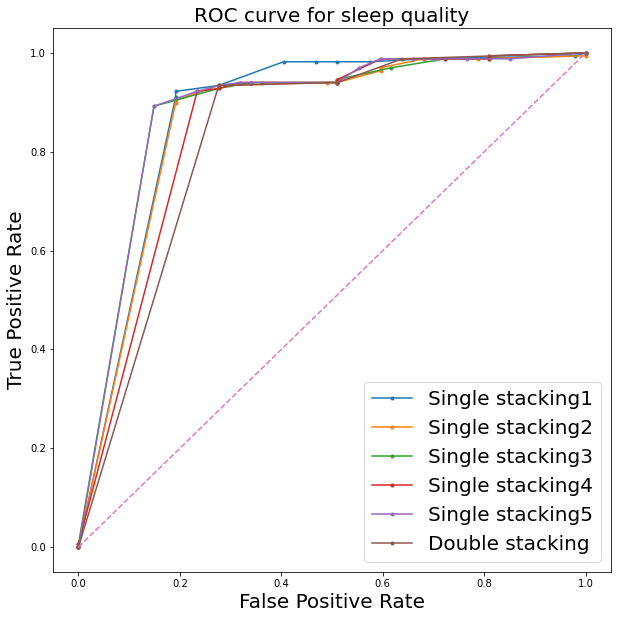

In [833]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(mt_fpr1, mt_tpr1, marker = '.', label = "Single stacking1")
plt.plot(mt_fpr2, mt_tpr2, marker = '.', label = "Single stacking2")
plt.plot(mt_fpr3, mt_tpr3, marker = '.', label = "Single stacking3")
plt.plot(mt_fpr4, mt_tpr4, marker = '.', label = "Single stacking4")
plt.plot(mt_fpr5, mt_tpr5, marker = '.', label = "Single stacking5")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Double stacking")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for sleep quality", size = 20)
plt.show()

## 3-2. 수면의 질 (sleepProblem)

In [26]:
sleep=final['sleepProblem'].apply(lambda x: 0 if x==0 else 1)

In [27]:
sleep.value_counts()

0    596
1    473
Name: sleepProblem, dtype: int64

In [28]:
sleep=sleep.reset_index(drop=True)

In [29]:
feature

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
0,45,0,4.0,4.0,1,1,1,27,-0.013653,3.103176,86.727616,33.021747,0.000000
1,30,0,5.0,4.0,1,1,1,27,0.056283,2.503302,87.789920,34.441982,0.000000
2,20,0,5.0,2.0,1,1,1,27,0.036912,3.373406,85.270147,33.193400,0.000000
3,20,0,3.0,2.0,0,0,1,27,0.009140,1.663482,89.475536,34.086428,0.000000
4,35,0,4.0,4.0,1,1,1,27,-0.004555,0.773490,88.103819,34.190778,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,81,4,3.0,2.0,0,0,1,24,0.000718,0.120715,88.643042,35.732362,0.000000
1065,89,0,3.0,2.0,0,0,1,24,-0.002291,0.206694,78.212777,35.668583,0.000000
1066,140,0,3.0,3.0,1,0,1,24,0.000417,0.693704,84.231193,35.719695,0.000000
1067,17,0,3.0,3.0,1,0,1,24,-0.007869,0.430001,82.935526,35.455277,166.408832


In [30]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

train_features, test_features, train_labels, test_labels= train_test_split(feature,sleep,stratify=sleep, test_size=0.2, shuffle=True)

In [31]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [32]:
train_features=pd.DataFrame(train_features, columns=feature.columns)

In [33]:
test_features=pd.DataFrame(test_features, columns=feature.columns)

In [34]:
train_features.agg(['mean','std']).round(2)

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
mean,0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [35]:
lr = LogisticRegression()
lr.fit(train_features, train_labels)

LogisticRegression()

In [36]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV

param_grid = {
    'C': np.logspace(-3, 3, 7),  # Regularization strength
    'penalty': ['l1', 'l2']      # Regularization type
}

# Create a k-fold cross-validation object with k=5
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(lr, param_grid, cv=kfold)

# Perform hyperparameter tuning with k-fold cross-validation on the training set
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(grid_search.best_params_)

# Train the model with the best hyperparameters on the entire training set
lr = grid_search.best_estimator_
lr.fit(test_features, test_labels)

# Evaluate the best model on the testing set
test_accuracy = lr.score(test_features, test_labels)
print(f"Testing Accuracy: {test_accuracy:.4f}")

Best Hyperparameters:
{'C': 0.01, 'penalty': 'l2'}
Testing Accuracy: 0.6121


C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
70 fits failed out of a total of 140.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
70 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueError: Sol

In [37]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, roc_curve, r2_score, accuracy_score, f1_score
from sklearn.metrics import recall_score, precision_score, confusion_matrix, classification_report, roc_auc_score, auc

In [38]:
print(lr.score(test_features, test_labels))

0.6121495327102804


In [64]:
probs = lr.predict_proba(test_features)[:,1]
lr_fpr, lr_tpr, threshold1 = roc_curve(test_labels, probs)

In [39]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=kfold)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Decision Tree classifier with the best hyperparameters
dt = DecisionTreeClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
dt.fit(train_features, train_labels)

# Make predictions
y_pred = dt.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = dt.predict_proba(test_features)[:,1]
dt_fpr, dt_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.7570093457943925


In [41]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'n_estimators': [10, 50, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=10)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
rf = RandomForestClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
rf.fit(train_features, train_labels)

# Make predictions
y_pred = rf.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = rf.predict_proba(test_features)[:,1]
rf_fpr, rf_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.794392523364486


In [42]:
import xgboost as xgb

# Define the hyperparameter grid to search over
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.001],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0],
    'gamma': [0, 1, 2],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5],
}

# Create an instance of the XGBoost classifier
xgb_model = xgb.XGBClassifier()

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=10)

# Fit the grid search to the data
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters and corresponding accuracy
print("Best Hyperparameters: ", grid_search.best_params_)
print("Best Accuracy: ", grid_search.best_score_)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
xgb = xgb.XGBClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
xgb.fit(train_features, train_labels)

# Make predictions
y_pred = xgb.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = xgb.predict_proba(test_features)[:,1]
xgb_fpr, xgb_tpr, threshold1 = roc_curve(test_labels, probs)

Best Hyperparameters:  {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 200, 'reg_alpha': 0.5, 'reg_lambda': 0.1, 'subsample': 1.0}
Best Accuracy:  0.7204377564979481
Accuracy: 0.7757009345794392


In [54]:
lgbm_best = LGBMClassifier(**best_params)

In [43]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier()

# Define hyperparameter grid for tuning
param_grid = {
    'boosting_type': ['gbdt', 'dart', 'goss'],
    'num_leaves': [31, 63],
    'max_depth': [-1, 5, 10],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'objective': ['binary'],
    'reg_alpha': [0.0, 0.1, 0.2],
    'reg_lambda': [0.0, 0.1, 0.2],
    'n_jobs': [-1],
    'silent': [True]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Train the LightGBM classifier with the best hyperparameters
lgbm_best = LGBMClassifier(**best_params)
lgbm_best.fit(train_labels, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

C:\Users\pc\anaconda3\lib\site-packages\dask\dataframe\utils.py:369: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
C:\Users\pc\anaconda3\lib\site-packages\dask\dataframe\utils.py:369: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
C:\Users\pc\anaconda3\lib\site-packages\dask\dataframe\utils.py:369: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated

ValueError: Expected 2D array, got 1D array instead:
array=[1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0
 0 1 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 0 0 1 1 0 1 1 0 1 1 0 0 0 1 1 0 1 0 1 1
 0 0 0 0 1 1 0 0 1 1 1 1 1 1 1 1 0 0 1 0 0 1 1 1 0 0 0 1 0 1 1 0 0 0 0 0 1
 0 1 0 0 1 1 0 1 1 0 0 1 1 0 0 0 0 1 0 1 1 0 1 0 1 1 0 1 0 0 1 1 0 1 1 1 1
 0 0 1 1 0 1 1 1 0 0 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 0 0 1 1 0 0 0 0 0 1 1 1
 0 1 0 1 1 0 0 0 1 0 1 0 1 1 0 1 1 0 1 1 1 1 0 0 0 0 0 1 1 1 1 0 1 1 1 0 1
 1 1 1 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 0 0 0 1 1
 1 1 1 0 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0
 1 0 1 0 0 0 1 0 1 0 0 1 1 1 0 1 0 1 1 0 0 1 1 0 0 0 0 0 0 1 1 1 1 0 1 1 0
 0 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0 1 1 0 1 1 0 0 1 0 1 1 1 0 1 0 0 1 1 0 1 0
 1 1 1 1 1 1 1 1 1 1 0 0 0 1 0 1 1 1 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 0 0 1 0
 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 0
 1 1 0 0 1 0 1 0 1 0 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0 1 0 1 1 1 0 0 0 1
 0 1 1 0 0 1 0 0 1 0 1 1 0 1 0 1 1 1 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0
 1 1 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 1 1 0 0 0 0 1 1 1 0 1 1 0 1 1 0 0 0 0 0 1 0 1 1 1 1 0 1 0 0 1 0 1 0
 0 1 0 1 0 1 1 1 0 1 0 0 1 0 0 0 1 0 0 1 1 0 0 1 0 1 0 1 0 1 0 0 1 0 0 1 0
 0 1 1 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 1 0
 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 1 1 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1
 1 1 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0 1 1 0 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 0
 1 0 1 0 0 1 0 0 0 1 1 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 1
 0 1 1 0].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [56]:
lgbm_best.fit(train_features, train_labels)

C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "


LGBMClassifier(boosting_type='dart', learning_rate=0.2, max_depth=5,
               n_estimators=200, objective='binary', reg_alpha=0.1,
               reg_lambda=0.2, silent=True)

In [44]:
lgbm_best.fit(train_features, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

probs = lgbm_best.predict_proba(test_features)[:,1]
lgbm_fpr, lgbm_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 78.50%


C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "


In [58]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = lr.predict(train_features)
decision_tree_pred_train = dt.predict(train_features)
random_forest_pred_train = rf.predict(train_features)
xgboost_pred_train = xgb.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = lr.predict(test_features)
decision_tree_pred_test = dt.predict(test_features)
random_forest_pred_test = rf.predict(test_features)
xgboost_pred_test = xgb.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

Accuracy of stacking ensemble: 78.97%


In [59]:
y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]

In [60]:
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

In [61]:
roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

0.8333480760725341


[Text(0, 0.5, 'Sleep'), Text(0, 1.5, 'NoSleep')]

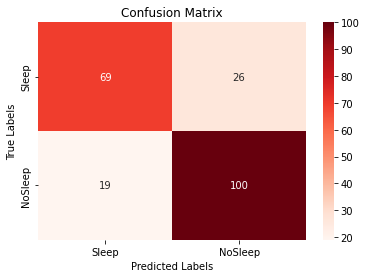

In [62]:
from sklearn.metrics import classification_report, confusion_matrix

cm=confusion_matrix(test_labels, stacking_pred, labels=[1,0])
ax=plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, cmap='Reds', fmt='d')
ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.xaxis.set_ticklabels(['Sleep','NoSleep'])
ax.yaxis.set_ticklabels(['Sleep','NoSleep'])

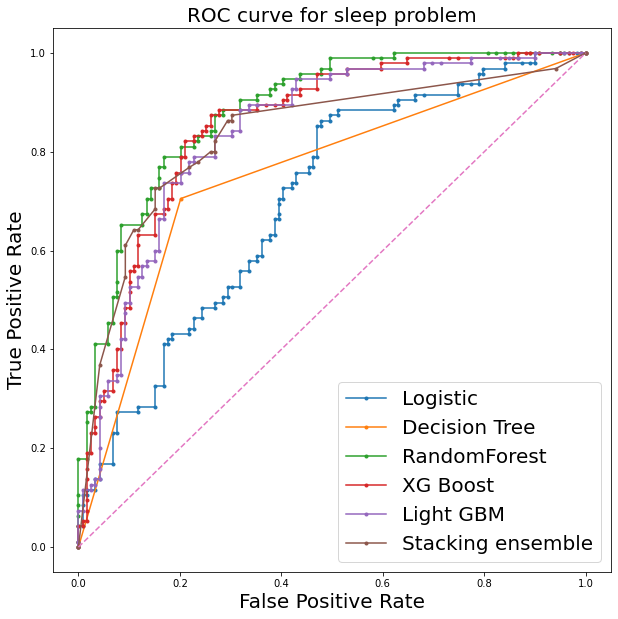

In [65]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(lr_fpr, lr_tpr, marker = '.', label = "Logistic")
plt.plot(dt_fpr, dt_tpr, marker = '.', label = "Decision Tree")
plt.plot(rf_fpr, rf_tpr, marker = '.', label = "RandomForest")
plt.plot(xgb_fpr, xgb_tpr, marker = '.', label = "XG Boost")
plt.plot(lgbm_fpr, lgbm_tpr, marker = '.', label = "Light GBM")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Stacking ensemble")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for sleep problem", size = 20)
plt.show()

In [66]:
# Initialize the meta model
meta_model1 = LogisticRegression()
meta_model2 = LogisticRegression()
meta_model3 = LogisticRegression()
meta_model4 = LogisticRegression()
meta_model5 = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = lr.predict(train_features)
decision_tree_pred_train = dt.predict(train_features)
random_forest_pred_train = rf.predict(train_features)
xgboost_pred_train = xgb.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X1 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train))

meta_train_X2 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 lgbm_pred_train))

meta_train_X3 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X4 = np.column_stack((logistic_regression_pred_train,
                                 
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X5 = np.column_stack((
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))


# Train the meta model on the meta-training dataset
meta_model1.fit(meta_train_X1, train_labels)
meta_model2.fit(meta_train_X2, train_labels)
meta_model3.fit(meta_train_X3, train_labels)
meta_model4.fit(meta_train_X4, train_labels)
meta_model5.fit(meta_train_X5, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = lr.predict(test_features)
decision_tree_pred_test = dt.predict(test_features)
random_forest_pred_test = rf.predict(test_features)
xgboost_pred_test = xgb.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X1 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test))

meta_test_X2 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                lgbm_pred_test))

meta_test_X3 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                               
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X4 = np.column_stack((logistic_regression_pred_test,
                                
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X5 = np.column_stack((
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred1 = meta_model1.predict(meta_test_X1)

stacking_pred2 = meta_model2.predict(meta_test_X2)

stacking_pred3 = meta_model3.predict(meta_test_X3)

stacking_pred4 = meta_model4.predict(meta_test_X4)

stacking_pred5 = meta_model5.predict(meta_test_X5)

# Calculate accuracy score of stacking ensemble
accuracy1 = accuracy_score(test_labels, stacking_pred1)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy1 * 100))

accuracy2 = accuracy_score(test_labels, stacking_pred2)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy2 * 100))

accuracy3 = accuracy_score(test_labels, stacking_pred3)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy3 * 100))

accuracy4 = accuracy_score(test_labels, stacking_pred4)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy4 * 100))

accuracy5 = accuracy_score(test_labels, stacking_pred5)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy5 * 100))

y_pred_meta1 = meta_model1.predict_proba(meta_test_X1)[:, 1]
mt_fpr1, mt_tpr1, threshold1 = roc_curve(test_labels, y_pred_meta1)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta2 = meta_model2.predict_proba(meta_test_X2)[:, 1]
mt_fpr2, mt_tpr2, threshold1 = roc_curve(test_labels, y_pred_meta2)

roc_auc = auc(mt_fpr2, mt_tpr2)
print(roc_auc)

y_pred_meta3 = meta_model3.predict_proba(meta_test_X3)[:, 1]
mt_fpr3, mt_tpr3, threshold1 = roc_curve(test_labels, y_pred_meta3)

roc_auc = auc(mt_fpr3, mt_tpr3)
print(roc_auc)

y_pred_meta4 = meta_model4.predict_proba(meta_test_X4)[:, 1]
mt_fpr4, mt_tpr4, threshold1 = roc_curve(test_labels, y_pred_meta4)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta5 = meta_model5.predict_proba(meta_test_X5)[:, 1]
mt_fpr5, mt_tpr5, threshold1 = roc_curve(test_labels, y_pred_meta5)

roc_auc = auc(mt_fpr5, mt_tpr5)
print(roc_auc)

Accuracy of stacking ensemble: 78.97%
Accuracy of stacking ensemble: 76.17%
Accuracy of stacking ensemble: 77.10%
Accuracy of stacking ensemble: 78.50%
Accuracy of stacking ensemble: 79.44%
0.8337019018133568
0.832330827067669
0.811233967271119
0.8337019018133568
0.8354710305174702


In [67]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
meta_model1_pred_train = meta_model1.predict(meta_train_X1)
meta_model2_pred_train = meta_model2.predict(meta_train_X2)
meta_model3_pred_train = meta_model3.predict(meta_train_X3)
meta_model4_pred_train = meta_model4.predict(meta_train_X4)
meta_model5_pred_train = meta_model5.predict(meta_train_X5)

# Create a meta-training dataset
meta_train_X = np.column_stack((meta_model1_pred_train,
                                 meta_model2_pred_train,
                                 meta_model3_pred_train,
                                 meta_model4_pred_train, meta_model5_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
meta_model1_pred_test = meta_model1.predict(meta_test_X1)
meta_model2_pred_test = meta_model2.predict(meta_test_X2)
meta_model3_pred_test = meta_model3.predict(meta_test_X3)
meta_model4_pred_test = meta_model4.predict(meta_test_X4)
meta_model5_pred_test = meta_model5.predict(meta_test_X5)

# Create a meta-testing dataset
meta_test_X = np.column_stack((meta_model1_pred_test,
                                meta_model2_pred_test,
                                meta_model3_pred_test,
                                meta_model4_pred_test, meta_model5_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

Accuracy of stacking ensemble: 78.04%
0.7973463069438301


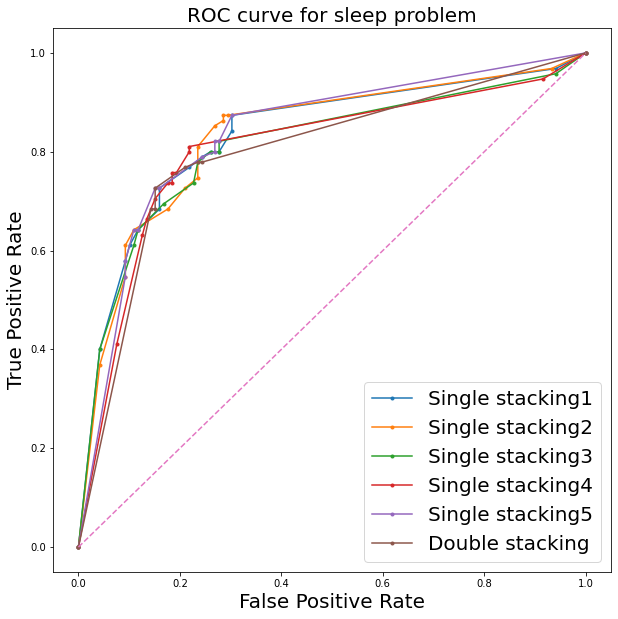

In [69]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(mt_fpr1, mt_tpr1, marker = '.', label = "Single stacking1")
plt.plot(mt_fpr2, mt_tpr2, marker = '.', label = "Single stacking2")
plt.plot(mt_fpr3, mt_tpr3, marker = '.', label = "Single stacking3")
plt.plot(mt_fpr4, mt_tpr4, marker = '.', label = "Single stacking4")
plt.plot(mt_fpr5, mt_tpr5, marker = '.', label = "Single stacking5")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Double stacking")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for sleep problem", size = 20)
plt.show()

## 3-3. 악몽 여부 (dream)

In [70]:
sleep=final['dream'].apply(lambda x: 1 if x==1 else 0)

In [669]:
final['sleep'].value_counts()

4.0    441
3.0    312
2.0    200
5.0     82
1.0     34
Name: sleep, dtype: int64

In [670]:
sleep.value_counts()

1    835
0    234
Name: sleep, dtype: int64

In [71]:
sleep=sleep.reset_index(drop=True)

In [72]:
feature

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
0,45,0,4.0,4.0,1,1,1,27,-0.013653,3.103176,86.727616,33.021747,0.000000
1,30,0,5.0,4.0,1,1,1,27,0.056283,2.503302,87.789920,34.441982,0.000000
2,20,0,5.0,2.0,1,1,1,27,0.036912,3.373406,85.270147,33.193400,0.000000
3,20,0,3.0,2.0,0,0,1,27,0.009140,1.663482,89.475536,34.086428,0.000000
4,35,0,4.0,4.0,1,1,1,27,-0.004555,0.773490,88.103819,34.190778,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,81,4,3.0,2.0,0,0,1,24,0.000718,0.120715,88.643042,35.732362,0.000000
1065,89,0,3.0,2.0,0,0,1,24,-0.002291,0.206694,78.212777,35.668583,0.000000
1066,140,0,3.0,3.0,1,0,1,24,0.000417,0.693704,84.231193,35.719695,0.000000
1067,17,0,3.0,3.0,1,0,1,24,-0.007869,0.430001,82.935526,35.455277,166.408832


In [73]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

train_features, test_features, train_labels, test_labels= train_test_split(feature,sleep,stratify=sleep, test_size=0.2, shuffle=True)

In [74]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [75]:
train_features=pd.DataFrame(train_features, columns=feature.columns)

In [76]:
test_features=pd.DataFrame(test_features, columns=feature.columns)

In [77]:
train_features.agg(['mean','std']).round(2)

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
mean,0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [78]:
lr = LogisticRegression()
lr.fit(train_features, train_labels)

LogisticRegression()

In [79]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV

param_grid = {
    'C': np.logspace(-3, 3, 7),  # Regularization strength
    'penalty': ['l1', 'l2']      # Regularization type
}

# Create a k-fold cross-validation object with k=5
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(lr, param_grid, cv=kfold)

# Perform hyperparameter tuning with k-fold cross-validation on the training set
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(grid_search.best_params_)

# Train the model with the best hyperparameters on the entire training set
lr = grid_search.best_estimator_
lr.fit(test_features, test_labels)

# Evaluate the best model on the testing set
test_accuracy = lr.score(test_features, test_labels)
print(f"Testing Accuracy: {test_accuracy:.4f}")

Best Hyperparameters:
{'C': 0.001, 'penalty': 'l2'}
Testing Accuracy: 0.9626


C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
70 fits failed out of a total of 140.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
70 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueError: Sol

In [80]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, roc_curve, r2_score, accuracy_score, f1_score
from sklearn.metrics import recall_score, precision_score, confusion_matrix, classification_report, roc_auc_score, auc

In [81]:
print(lr.score(test_features, test_labels))

0.9626168224299065


In [82]:
clf = DecisionTreeClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=kfold)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Decision Tree classifier with the best hyperparameters
dt = DecisionTreeClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
dt.fit(train_features, train_labels)

# Make predictions
y_pred = dt.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = dt.predict_proba(test_features)[:,1]
dt_fpr, dt_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.9532710280373832


In [83]:
clf = RandomForestClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'n_estimators': [10, 50, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=10)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
rf = RandomForestClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
rf.fit(train_features, train_labels)

# Make predictions
y_pred = rf.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = rf.predict_proba(test_features)[:,1]
rf_fpr, rf_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.9626168224299065


In [84]:
import xgboost as xgb

# Define the hyperparameter grid to search over
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.001],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0],
    'gamma': [0, 1, 2],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5],
}

# Create an instance of the XGBoost classifier
xgb_model = xgb.XGBClassifier()

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=10)

# Fit the grid search to the data
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters and corresponding accuracy
print("Best Hyperparameters: ", grid_search.best_params_)
print("Best Accuracy: ", grid_search.best_score_)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
xgb = xgb.XGBClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
xgb.fit(train_features, train_labels)

# Make predictions
y_pred = xgb.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = xgb.predict_proba(test_features)[:,1]
xgb_fpr, xgb_tpr, threshold1 = roc_curve(test_labels, probs)

Best Hyperparameters:  {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100, 'reg_alpha': 0, 'reg_lambda': 0.5, 'subsample': 0.8}
Best Accuracy:  0.9684404924760601
Accuracy: 0.9626168224299065


In [749]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier()

# Define hyperparameter grid for tuning
param_grid = {
    'boosting_type': ['gbdt', 'dart', 'goss'],
    'num_leaves': [31, 63],
    'max_depth': [-1, 5, 10],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'objective': ['binary'],
    'reg_alpha': [0.0, 0.1, 0.2],
    'reg_lambda': [0.0, 0.1, 0.2],
    'n_jobs': [-1],
    'silent': [True]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Train the LightGBM classifier with the best hyperparameters
lgbm_best = LGBMClassifier(**best_params)
lgbm_best.fit(train_labels, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-pac

ValueError: Expected 2D array, got 1D array instead:
array=[1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0 0 1 0 0 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1
 1 1 1 1 1 0 0 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0
 0 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 0
 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 0 1 0 1 1 1 0 1 1
 0 1 0 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 0 1 1 1 1 1 1
 0 1 1 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0
 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 0
 1 0 1 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 0 0 0
 1 1 1 0 1 0 0 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 0 0 1 0 1 0 1 0 1 0 1 1 0 1 1 0 1 1
 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1
 1 1 1 0 1 1 0 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 0 1 1
 1 1 1 0 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0
 1 1 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 1 0 1
 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 0 1 0 1 1 1
 1 1 1 0 1 1 1 0 1 1 1 0 1 0 1 1 0 1 0 1 1 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 1 1 1 0
 1 0 1 1].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [85]:
lgbm_best.fit(train_features, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

probs = lgbm_best.predict_proba(test_features)[:,1]
lgbm_fpr, lgbm_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 94.39%


C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "


In [794]:
stacking_pred

array([1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], dtype=int64)

In [793]:
probs

array([0.95924906, 0.93564804, 0.25646566, 0.99094986, 0.87128606,
       0.96874236, 0.97702064, 0.99019274, 0.91494623, 0.39012982,
       0.06999261, 0.94314665, 0.82781167, 0.97326681, 0.98016794,
       0.98521892, 0.76296837, 0.9431974 , 0.89879247, 0.52173726,
       0.76942572, 0.34912373, 0.87606128, 0.93696986, 0.63629192,
       0.82136094, 0.83384831, 0.98240215, 0.94628343, 0.62367385,
       0.25152885, 0.94531185, 0.95523077, 0.99430253, 0.58648059,
       0.97360665, 0.76565319, 0.94618097, 0.11068171, 0.88494877,
       0.39196825, 0.9645753 , 0.99427579, 0.7620071 , 0.79813246,
       0.97213665, 0.97362734, 0.06999261, 0.95154111, 0.94743673,
       0.90855003, 0.90769343, 0.39644685, 0.94813763, 0.93166876,
       0.87819196, 0.99046815, 0.93337527, 0.98410621, 0.30738034,
       0.25646566, 0.46356979, 0.83030132, 0.092644  , 0.98604146,
       0.94314665, 0.97318523, 0.95356328, 0.91220138, 0.79896795,
       0.91488423, 0.98670387, 0.92828   , 0.97733059, 0.93067

In [87]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = lr.predict(train_features)
decision_tree_pred_train = dt.predict(train_features)
random_forest_pred_train = rf.predict(train_features)
xgboost_pred_train = xgb.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = lr.predict(test_features)
decision_tree_pred_test = dt.predict(test_features)
random_forest_pred_test = rf.predict(test_features)
xgboost_pred_test = xgb.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

Accuracy of stacking ensemble: 96.26%


In [88]:
y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]

In [89]:
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

In [90]:
roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

0.6080097087378641


[Text(0, 0.5, 'Sleep'), Text(0, 1.5, 'NoSleep')]

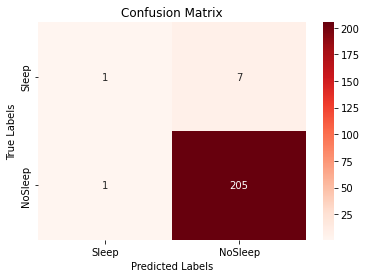

In [91]:
from sklearn.metrics import classification_report, confusion_matrix

cm=confusion_matrix(test_labels, stacking_pred, labels=[1,0])
ax=plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, cmap='Reds', fmt='d')
ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.xaxis.set_ticklabels(['Sleep','NoSleep'])
ax.yaxis.set_ticklabels(['Sleep','NoSleep'])

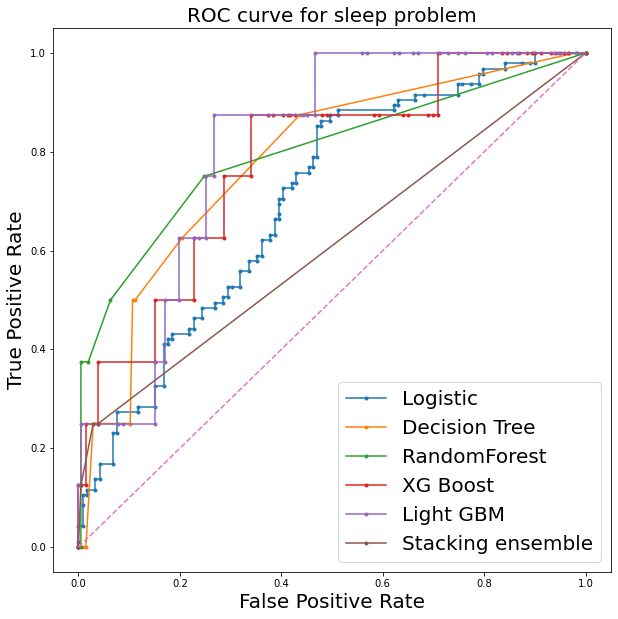

In [93]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(lr_fpr, lr_tpr, marker = '.', label = "Logistic")
plt.plot(dt_fpr, dt_tpr, marker = '.', label = "Decision Tree")
plt.plot(rf_fpr, rf_tpr, marker = '.', label = "RandomForest")
plt.plot(xgb_fpr, xgb_tpr, marker = '.', label = "XG Boost")
plt.plot(lgbm_fpr, lgbm_tpr, marker = '.', label = "Light GBM")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Stacking ensemble")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for sleep problem", size = 20)
plt.show()

In [95]:
# Initialize the meta model
meta_model1 = LogisticRegression()
meta_model2 = LogisticRegression()
meta_model3 = LogisticRegression()
meta_model4 = LogisticRegression()
meta_model5 = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = lr.predict(train_features)
decision_tree_pred_train = dt.predict(train_features)
random_forest_pred_train = rf.predict(train_features)
xgboost_pred_train = xgb.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X1 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train))

meta_train_X2 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 lgbm_pred_train))

meta_train_X3 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X4 = np.column_stack((logistic_regression_pred_train,
                                 
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X5 = np.column_stack((
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))


# Train the meta model on the meta-training dataset
meta_model1.fit(meta_train_X1, train_labels)
meta_model2.fit(meta_train_X2, train_labels)
meta_model3.fit(meta_train_X3, train_labels)
meta_model4.fit(meta_train_X4, train_labels)
meta_model5.fit(meta_train_X5, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = lr.predict(test_features)
decision_tree_pred_test = dt.predict(test_features)
random_forest_pred_test = rf.predict(test_features)
xgboost_pred_test = xgb.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X1 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test))

meta_test_X2 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                lgbm_pred_test))

meta_test_X3 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                               
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X4 = np.column_stack((logistic_regression_pred_test,
                                
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X5 = np.column_stack((
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred1 = meta_model1.predict(meta_test_X1)

stacking_pred2 = meta_model2.predict(meta_test_X2)

stacking_pred3 = meta_model3.predict(meta_test_X3)

stacking_pred4 = meta_model4.predict(meta_test_X4)

stacking_pred5 = meta_model5.predict(meta_test_X5)

# Calculate accuracy score of stacking ensemble
accuracy1 = accuracy_score(test_labels, stacking_pred1)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy1 * 100))

accuracy2 = accuracy_score(test_labels, stacking_pred2)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy2 * 100))

accuracy3 = accuracy_score(test_labels, stacking_pred3)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy3 * 100))

accuracy4 = accuracy_score(test_labels, stacking_pred4)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy4 * 100))

accuracy5 = accuracy_score(test_labels, stacking_pred5)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy5 * 100))

y_pred_meta1 = meta_model1.predict_proba(meta_test_X1)[:, 1]
mt_fpr1, mt_tpr1, threshold1 = roc_curve(test_labels, y_pred_meta1)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta2 = meta_model2.predict_proba(meta_test_X2)[:, 1]
mt_fpr2, mt_tpr2, threshold1 = roc_curve(test_labels, y_pred_meta2)

roc_auc = auc(mt_fpr2, mt_tpr2)
print(roc_auc)

y_pred_meta3 = meta_model3.predict_proba(meta_test_X3)[:, 1]
mt_fpr3, mt_tpr3, threshold1 = roc_curve(test_labels, y_pred_meta3)

roc_auc = auc(mt_fpr3, mt_tpr3)
print(roc_auc)

y_pred_meta4 = meta_model4.predict_proba(meta_test_X4)[:, 1]
mt_fpr4, mt_tpr4, threshold1 = roc_curve(test_labels, y_pred_meta4)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta5 = meta_model5.predict_proba(meta_test_X5)[:, 1]
mt_fpr5, mt_tpr5, threshold1 = roc_curve(test_labels, y_pred_meta5)

roc_auc = auc(mt_fpr5, mt_tpr5)
print(roc_auc)

Accuracy of stacking ensemble: 96.26%
Accuracy of stacking ensemble: 94.39%
Accuracy of stacking ensemble: 96.26%
Accuracy of stacking ensemble: 96.26%
Accuracy of stacking ensemble: 96.26%
0.5558252427184467
0.6080097087378641
0.6080097087378641
0.5558252427184467
0.6080097087378641


In [96]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
meta_model1_pred_train = meta_model1.predict(meta_train_X1)
meta_model2_pred_train = meta_model2.predict(meta_train_X2)
meta_model3_pred_train = meta_model3.predict(meta_train_X3)
meta_model4_pred_train = meta_model4.predict(meta_train_X4)
meta_model5_pred_train = meta_model5.predict(meta_train_X5)

# Create a meta-training dataset
meta_train_X = np.column_stack((meta_model1_pred_train,
                                 meta_model2_pred_train,
                                 meta_model3_pred_train,
                                 meta_model4_pred_train, meta_model5_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
meta_model1_pred_test = meta_model1.predict(meta_test_X1)
meta_model2_pred_test = meta_model2.predict(meta_test_X2)
meta_model3_pred_test = meta_model3.predict(meta_test_X3)
meta_model4_pred_test = meta_model4.predict(meta_test_X4)
meta_model5_pred_test = meta_model5.predict(meta_test_X5)

# Create a meta-testing dataset
meta_test_X = np.column_stack((meta_model1_pred_test,
                                meta_model2_pred_test,
                                meta_model3_pred_test,
                                meta_model4_pred_test, meta_model5_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

Accuracy of stacking ensemble: 96.26%
0.6116504854368932


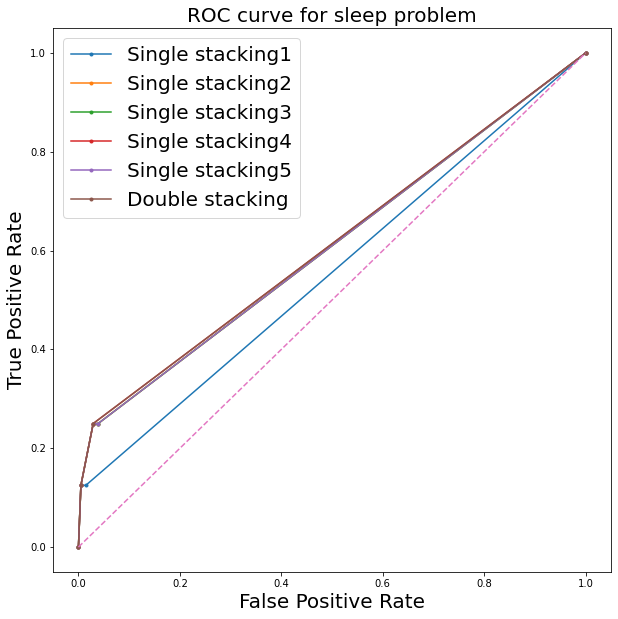

In [97]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(mt_fpr1, mt_tpr1, marker = '.', label = "Single stacking1")
plt.plot(mt_fpr2, mt_tpr2, marker = '.', label = "Single stacking2")
plt.plot(mt_fpr3, mt_tpr3, marker = '.', label = "Single stacking3")
plt.plot(mt_fpr4, mt_tpr4, marker = '.', label = "Single stacking4")
plt.plot(mt_fpr5, mt_tpr5, marker = '.', label = "Single stacking5")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Double stacking")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for sleep problem", size = 20)
plt.show()

In [47]:
scaler = StandardScaler()
train_features, test_features, train_labels, test_labels= train_test_split(feature,sleep,stratify=sleep, test_size=0.2, shuffle=True)

In [48]:
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [49]:
train_features=pd.DataFrame(train_features, columns=feature.columns)

In [50]:
test_features=pd.DataFrame(test_features, columns=feature.columns)

In [51]:
model = LogisticRegression()
model.fit(train_features, train_labels)

LogisticRegression()

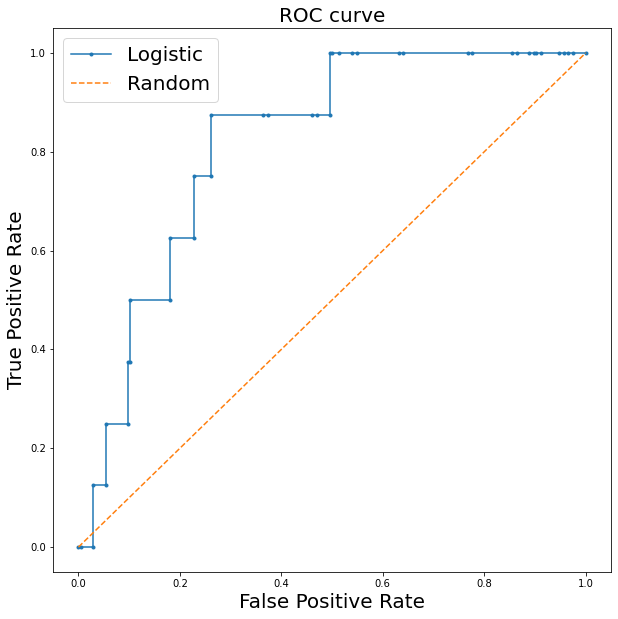



 ROC AUC score :  0.8191747572815534
[[  0   8]
 [  0 206]]
accuracy score: 0.9626168224299065
precision score: 0.0
recall score: 0.0
f1 score: 0.0
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       206
           1       0.00      0.00      0.00         8

    accuracy                           0.96       214
   macro avg       0.48      0.50      0.49       214
weighted avg       0.93      0.96      0.94       214



C:\Users\pc\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pc\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pc\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pc\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: Unde

In [52]:
### roc curve 패키지로 fpr, tpr 뽑기
y_pred=model.predict(test_features)
probs = model.predict_proba(test_features)[:,1]
model_fpr, model_tpr, threshold1 = roc_curve(test_labels, probs)

### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(model_fpr, model_tpr, marker = '.', label = "Logistic")
plt.plot(random_fpr, random_tpr, linestyle = '--', label = "Random")

plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve", size = 20)
plt.show()


### AUC 값 확인하기 (ROC curve 아래 부분 면적)
roc_auc = auc(model_fpr, model_tpr)
print("\n\n ROC AUC score : ", roc_auc)
print(confusion_matrix(test_labels, y_pred, labels=[1,0]))
print('accuracy score:', accuracy_score(test_labels, y_pred))
print('precision score:',precision_score(test_labels, y_pred, pos_label=1))
print('recall score:', recall_score(test_labels, y_pred, pos_label=1))
print('f1 score:', f1_score(test_labels, y_pred, pos_label=1))
print(classification_report(test_labels, y_pred))

In [53]:
print(model.score(test_features, test_labels))

0.9626168224299065


## 3-4. 수면 이후 주관적 신체상태 (amCondition)

In [98]:
sleep=final['amCondition'].apply(lambda x: 0 if x==1 or x==2 else 1)

In [99]:
train_features, test_features, train_labels, test_labels= train_test_split(feature,sleep,stratify=sleep, test_size=0.2, shuffle=True)

In [668]:
sleep=final['sleep'].apply(lambda x: 0 if x==1 or x==2 else 1)

In [100]:
final['sleep'].value_counts()

4.0    441
3.0    312
2.0    200
5.0     82
1.0     34
Name: sleep, dtype: int64

In [101]:
sleep.value_counts()

1    589
0    480
Name: amCondition, dtype: int64

In [102]:
sleep=sleep.reset_index(drop=True)

In [103]:
feature

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
0,45,0,4.0,4.0,1,1,1,27,-0.013653,3.103176,86.727616,33.021747,0.000000
1,30,0,5.0,4.0,1,1,1,27,0.056283,2.503302,87.789920,34.441982,0.000000
2,20,0,5.0,2.0,1,1,1,27,0.036912,3.373406,85.270147,33.193400,0.000000
3,20,0,3.0,2.0,0,0,1,27,0.009140,1.663482,89.475536,34.086428,0.000000
4,35,0,4.0,4.0,1,1,1,27,-0.004555,0.773490,88.103819,34.190778,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,81,4,3.0,2.0,0,0,1,24,0.000718,0.120715,88.643042,35.732362,0.000000
1065,89,0,3.0,2.0,0,0,1,24,-0.002291,0.206694,78.212777,35.668583,0.000000
1066,140,0,3.0,3.0,1,0,1,24,0.000417,0.693704,84.231193,35.719695,0.000000
1067,17,0,3.0,3.0,1,0,1,24,-0.007869,0.430001,82.935526,35.455277,166.408832


In [104]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

train_features, test_features, train_labels, test_labels= train_test_split(feature,sleep,stratify=sleep, test_size=0.2, shuffle=True)

In [105]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [106]:
train_features=pd.DataFrame(train_features, columns=feature.columns)

In [107]:
test_features=pd.DataFrame(test_features, columns=feature.columns)

In [108]:
train_features.agg(['mean','std']).round(2)

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
mean,-0.0,0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [109]:
lr = LogisticRegression()
lr.fit(train_features, train_labels)

LogisticRegression()

In [110]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold

param_grid = {
    'C': np.logspace(-3, 3, 7),  # Regularization strength
    'penalty': ['l1', 'l2']      # Regularization type
}

# Create a k-fold cross-validation object with k=5
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(lr, param_grid, cv=kfold)

# Perform hyperparameter tuning with k-fold cross-validation on the training set
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(grid_search.best_params_)

# Train the model with the best hyperparameters on the entire training set
lr = grid_search.best_estimator_
lr.fit(test_features, test_labels)

# Evaluate the best model on the testing set
test_accuracy = lr.score(test_features, test_labels)
print(f"Testing Accuracy: {test_accuracy:.4f}")

Best Hyperparameters:
{'C': 1.0, 'penalty': 'l2'}
Testing Accuracy: 0.6262


C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
70 fits failed out of a total of 140.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
70 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueError: Sol

In [111]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, roc_curve, r2_score, accuracy_score, f1_score
from sklearn.metrics import recall_score, precision_score, confusion_matrix, classification_report, roc_auc_score, auc

In [112]:
print(lr.score(test_features, test_labels))

0.6261682242990654


In [113]:
clf = DecisionTreeClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=kfold)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Decision Tree classifier with the best hyperparameters
dt = DecisionTreeClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
dt.fit(train_features, train_labels)

# Make predictions
y_pred = dt.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = dt.predict_proba(test_features)[:,1]
dt_fpr, dt_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.7523364485981309


In [114]:
clf = RandomForestClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'n_estimators': [10, 50, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=10)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
rf = RandomForestClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
rf.fit(train_features, train_labels)

# Make predictions
y_pred = rf.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = rf.predict_proba(test_features)[:,1]
rf_fpr, rf_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.7336448598130841


In [115]:
import xgboost as xgb

# Define the hyperparameter grid to search over
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.001],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0],
    'gamma': [0, 1, 2],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5],
}

# Create an instance of the XGBoost classifier
xgb_model = xgb.XGBClassifier()

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=10)

# Fit the grid search to the data
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters and corresponding accuracy
print("Best Hyperparameters: ", grid_search.best_params_)
print("Best Accuracy: ", grid_search.best_score_)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
xgb = xgb.XGBClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
xgb.fit(train_features, train_labels)

# Make predictions
y_pred = xgb.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = xgb.predict_proba(test_features)[:,1]
xgb_fpr, xgb_tpr, threshold1 = roc_curve(test_labels, probs)

Best Hyperparameters:  {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 200, 'reg_alpha': 0, 'reg_lambda': 0, 'subsample': 1.0}
Best Accuracy:  0.7508618331053352
Accuracy: 0.7149532710280374


In [117]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier()

# Define hyperparameter grid for tuning
param_grid = {
    'boosting_type': ['gbdt', 'dart', 'goss'],
    'num_leaves': [31, 63],
    'max_depth': [-1, 5, 10],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'objective': ['binary'],
    'reg_alpha': [0.0, 0.1, 0.2],
    'reg_lambda': [0.0, 0.1, 0.2],
    'n_jobs': [-1],
    'silent': [True]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid, scoring='accuracy', cv=10)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Train the LightGBM classifier with the best hyperparameters
lgbm_best = LGBMClassifier(**best_params)
lgbm_best.fit(train_labels, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-pac

ValueError: Expected 2D array, got 1D array instead:
array=[0 1 0 1 1 1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 0 0 0 0 1 1 1 0 1 1 0 1 0 1 1 1 0
 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1 1 0 0 1 0 1 0 0 0 0 0 1 0 1 1 1 1 1 0 1 1 0
 1 1 1 1 1 1 1 0 1 0 0 1 1 0 1 1 1 1 1 0 1 0 1 1 0 1 0 0 0 1 1 1 0 0 1 0 0
 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 1 1 1
 0 0 1 1 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 1 1 0 0 1 1 1
 1 0 0 1 1 1 1 0 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 0 0 0 1 0 1 1 1 0 1 1 1 1 1
 1 1 1 1 0 1 0 0 0 1 1 1 1 1 0 1 0 1 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 0 1 0 1
 1 1 0 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 1 1 1 0 0 1 1 0
 0 0 1 1 1 1 0 1 0 0 0 1 1 0 1 1 0 0 1 1 1 0 0 1 1 1 0 1 1 1 1 1 0 0 1 1 0
 1 1 0 1 0 1 0 0 0 1 1 1 1 1 0 1 0 1 1 0 1 0 0 0 1 0 0 1 1 0 1 1 1 1 0 0 1
 1 1 1 0 1 1 1 0 0 1 1 0 1 0 0 1 0 1 1 1 0 1 1 1 1 0 0 1 0 1 0 0 0 0 1 1 0
 0 0 1 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0 0 1 1 0 0 0 0 1 1 1 1 1 1 0 1 0 1 1 1
 1 0 1 1 0 0 1 0 1 0 1 1 1 1 1 0 0 0 0 1 1 1 0 1 0 1 0 1 0 1 1 1 1 1 0 0 0
 0 1 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 1 0 1 0 1 1 1 1 0 0 1 0 0 1 1 0 0 1 0 0
 1 0 1 1 0 0 0 0 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1 0 0 0 1 1
 1 1 1 1 0 0 0 0 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 1 0 0 1 0 1
 0 0 1 1 0 0 0 0 0 1 1 1 0 1 0 0 1 0 1 0 0 1 1 1 0 0 0 1 1 1 1 1 0 0 0 1 1
 1 0 1 0 1 1 1 0 0 0 0 0 1 1 1 0 1 0 0 0 0 1 1 1 0 0 0 1 1 0 0 1 1 0 0 1 1
 1 1 1 1 1 0 0 0 1 1 0 0 0 1 0 1 0 0 1 0 0 0 1 1 0 0 1 1 1 1 1 0 0 1 1 1 0
 0 1 1 0 0 0 0 0 0 1 0 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1 1 0 1 0 0 1 1 0 1 1 0
 0 1 1 1 0 0 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0 0 0 1 0 1 0 0
 1 0 0 0 1 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 1 0 0 1 1 1 1 0 1 1 0 0 0 1 0
 0 1 1 0 1 0 0 1 1 1 0 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 0 1 0 0
 0 0 1 0].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [118]:
lgbm_best.fit(train_features, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

probs = lgbm_best.predict_proba(test_features)[:,1]
lgbm_fpr, lgbm_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 77.10%


C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "


In [794]:
stacking_pred

array([1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], dtype=int64)

In [793]:
probs

array([0.95924906, 0.93564804, 0.25646566, 0.99094986, 0.87128606,
       0.96874236, 0.97702064, 0.99019274, 0.91494623, 0.39012982,
       0.06999261, 0.94314665, 0.82781167, 0.97326681, 0.98016794,
       0.98521892, 0.76296837, 0.9431974 , 0.89879247, 0.52173726,
       0.76942572, 0.34912373, 0.87606128, 0.93696986, 0.63629192,
       0.82136094, 0.83384831, 0.98240215, 0.94628343, 0.62367385,
       0.25152885, 0.94531185, 0.95523077, 0.99430253, 0.58648059,
       0.97360665, 0.76565319, 0.94618097, 0.11068171, 0.88494877,
       0.39196825, 0.9645753 , 0.99427579, 0.7620071 , 0.79813246,
       0.97213665, 0.97362734, 0.06999261, 0.95154111, 0.94743673,
       0.90855003, 0.90769343, 0.39644685, 0.94813763, 0.93166876,
       0.87819196, 0.99046815, 0.93337527, 0.98410621, 0.30738034,
       0.25646566, 0.46356979, 0.83030132, 0.092644  , 0.98604146,
       0.94314665, 0.97318523, 0.95356328, 0.91220138, 0.79896795,
       0.91488423, 0.98670387, 0.92828   , 0.97733059, 0.93067

In [135]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = lr.predict(train_features)
decision_tree_pred_train = dt.predict(train_features)
random_forest_pred_train = rf.predict(train_features)
xgboost_pred_train = xgb.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = lr.predict(test_features)
decision_tree_pred_test = dt.predict(test_features)
random_forest_pred_test = rf.predict(test_features)
xgboost_pred_test = xgb.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

Accuracy of stacking ensemble: 77.57%


In [136]:
y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]

In [137]:
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

In [138]:
roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

0.8230932203389831


[Text(0, 0.5, 'Sleep'), Text(0, 1.5, 'NoSleep')]

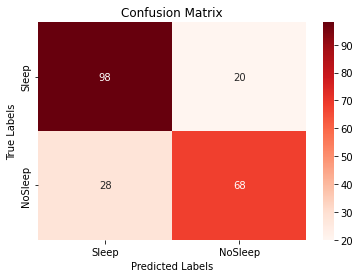

In [139]:
from sklearn.metrics import classification_report, confusion_matrix

cm=confusion_matrix(test_labels, stacking_pred, labels=[1,0])
ax=plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, cmap='Reds', fmt='d')
ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.xaxis.set_ticklabels(['Sleep','NoSleep'])
ax.yaxis.set_ticklabels(['Sleep','NoSleep'])

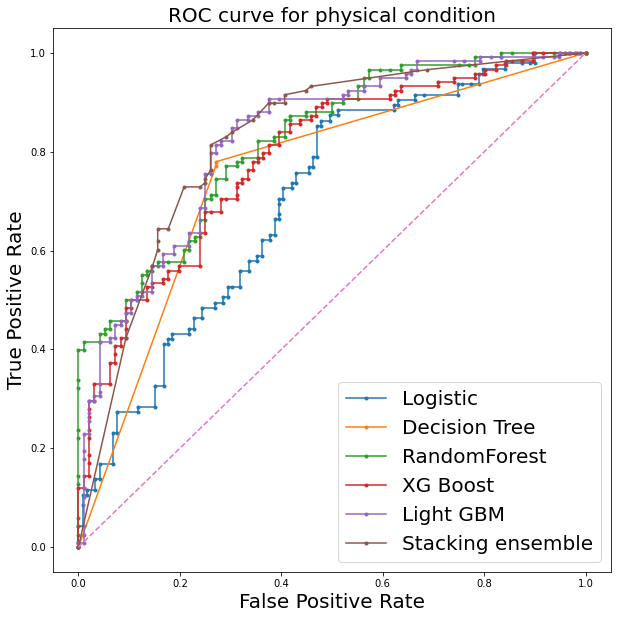

In [140]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(lr_fpr, lr_tpr, marker = '.', label = "Logistic")
plt.plot(dt_fpr, dt_tpr, marker = '.', label = "Decision Tree")
plt.plot(rf_fpr, rf_tpr, marker = '.', label = "RandomForest")
plt.plot(xgb_fpr, xgb_tpr, marker = '.', label = "XG Boost")
plt.plot(lgbm_fpr, lgbm_tpr, marker = '.', label = "Light GBM")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Stacking ensemble")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for physical condition", size = 20)
plt.show()

In [141]:
# Initialize the meta model
meta_model1 = LogisticRegression()
meta_model2 = LogisticRegression()
meta_model3 = LogisticRegression()
meta_model4 = LogisticRegression()
meta_model5 = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = lr.predict(train_features)
decision_tree_pred_train = dt.predict(train_features)
random_forest_pred_train = rf.predict(train_features)
xgboost_pred_train = xgb.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X1 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train))

meta_train_X2 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 lgbm_pred_train))

meta_train_X3 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X4 = np.column_stack((logistic_regression_pred_train,
                                 
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X5 = np.column_stack((
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))


# Train the meta model on the meta-training dataset
meta_model1.fit(meta_train_X1, train_labels)
meta_model2.fit(meta_train_X2, train_labels)
meta_model3.fit(meta_train_X3, train_labels)
meta_model4.fit(meta_train_X4, train_labels)
meta_model5.fit(meta_train_X5, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = lr.predict(test_features)
decision_tree_pred_test = dt.predict(test_features)
random_forest_pred_test = rf.predict(test_features)
xgboost_pred_test = xgb.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X1 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test))

meta_test_X2 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                lgbm_pred_test))

meta_test_X3 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                               
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X4 = np.column_stack((logistic_regression_pred_test,
                                
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X5 = np.column_stack((
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred1 = meta_model1.predict(meta_test_X1)

stacking_pred2 = meta_model2.predict(meta_test_X2)

stacking_pred3 = meta_model3.predict(meta_test_X3)

stacking_pred4 = meta_model4.predict(meta_test_X4)

stacking_pred5 = meta_model5.predict(meta_test_X5)

# Calculate accuracy score of stacking ensemble
accuracy1 = accuracy_score(test_labels, stacking_pred1)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy1 * 100))

accuracy2 = accuracy_score(test_labels, stacking_pred2)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy2 * 100))

accuracy3 = accuracy_score(test_labels, stacking_pred3)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy3 * 100))

accuracy4 = accuracy_score(test_labels, stacking_pred4)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy4 * 100))

accuracy5 = accuracy_score(test_labels, stacking_pred5)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy5 * 100))

y_pred_meta1 = meta_model1.predict_proba(meta_test_X1)[:, 1]
mt_fpr1, mt_tpr1, threshold1 = roc_curve(test_labels, y_pred_meta1)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta2 = meta_model2.predict_proba(meta_test_X2)[:, 1]
mt_fpr2, mt_tpr2, threshold1 = roc_curve(test_labels, y_pred_meta2)

roc_auc = auc(mt_fpr2, mt_tpr2)
print(roc_auc)

y_pred_meta3 = meta_model3.predict_proba(meta_test_X3)[:, 1]
mt_fpr3, mt_tpr3, threshold1 = roc_curve(test_labels, y_pred_meta3)

roc_auc = auc(mt_fpr3, mt_tpr3)
print(roc_auc)

y_pred_meta4 = meta_model4.predict_proba(meta_test_X4)[:, 1]
mt_fpr4, mt_tpr4, threshold1 = roc_curve(test_labels, y_pred_meta4)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta5 = meta_model5.predict_proba(meta_test_X5)[:, 1]
mt_fpr5, mt_tpr5, threshold1 = roc_curve(test_labels, y_pred_meta5)

roc_auc = auc(mt_fpr5, mt_tpr5)
print(roc_auc)

Accuracy of stacking ensemble: 75.23%
Accuracy of stacking ensemble: 77.10%
Accuracy of stacking ensemble: 76.64%
Accuracy of stacking ensemble: 74.77%
Accuracy of stacking ensemble: 78.04%
0.8157662429378532
0.8260504943502824
0.8269332627118644
0.8157662429378532
0.8164724576271187


In [142]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
meta_model1_pred_train = meta_model1.predict(meta_train_X1)
meta_model2_pred_train = meta_model2.predict(meta_train_X2)
meta_model3_pred_train = meta_model3.predict(meta_train_X3)
meta_model4_pred_train = meta_model4.predict(meta_train_X4)
meta_model5_pred_train = meta_model5.predict(meta_train_X5)

# Create a meta-training dataset
meta_train_X = np.column_stack((meta_model1_pred_train,
                                 meta_model2_pred_train,
                                 meta_model3_pred_train,
                                 meta_model4_pred_train, meta_model5_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
meta_model1_pred_test = meta_model1.predict(meta_test_X1)
meta_model2_pred_test = meta_model2.predict(meta_test_X2)
meta_model3_pred_test = meta_model3.predict(meta_test_X3)
meta_model4_pred_test = meta_model4.predict(meta_test_X4)
meta_model5_pred_test = meta_model5.predict(meta_test_X5)

# Create a meta-testing dataset
meta_test_X = np.column_stack((meta_model1_pred_test,
                                meta_model2_pred_test,
                                meta_model3_pred_test,
                                meta_model4_pred_test, meta_model5_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

Accuracy of stacking ensemble: 78.04%
0.7795286016949153


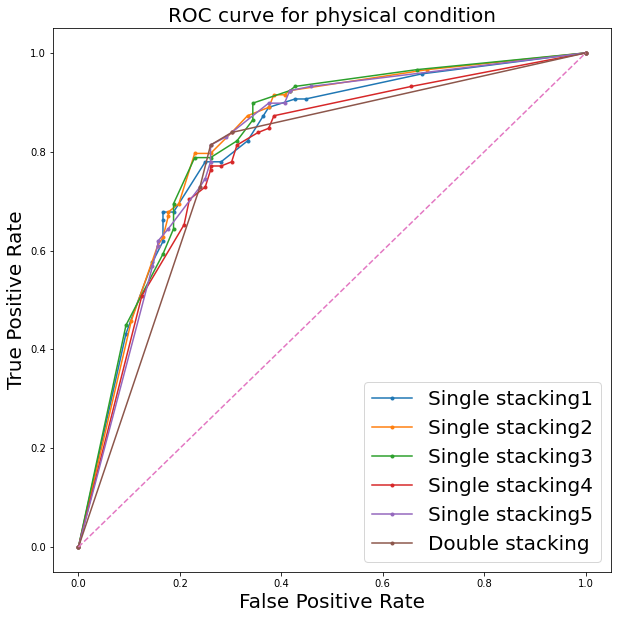

In [143]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(mt_fpr1, mt_tpr1, marker = '.', label = "Single stacking1")
plt.plot(mt_fpr2, mt_tpr2, marker = '.', label = "Single stacking2")
plt.plot(mt_fpr3, mt_tpr3, marker = '.', label = "Single stacking3")
plt.plot(mt_fpr4, mt_tpr4, marker = '.', label = "Single stacking4")
plt.plot(mt_fpr5, mt_tpr5, marker = '.', label = "Single stacking5")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Double stacking")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for physical condition", size = 20)
plt.show()

In [57]:
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [58]:
train_features=pd.DataFrame(train_features, columns=feature.columns)

In [59]:
test_features=pd.DataFrame(test_features, columns=feature.columns)

In [60]:
model = LogisticRegression()
model.fit(train_features, train_labels)

LogisticRegression()

In [61]:
print(model.score(test_features, test_labels))

0.616822429906542


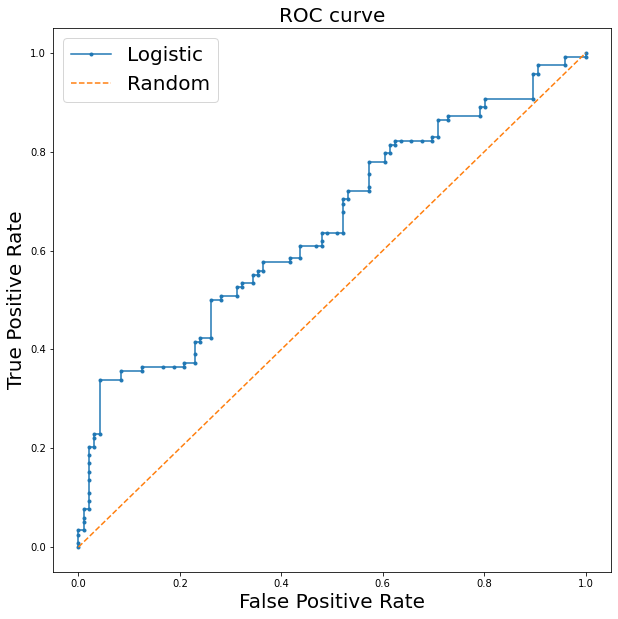



 ROC AUC score :  0.6504237288135593
[[92 26]
 [56 40]]
accuracy score: 0.616822429906542
precision score: 0.6216216216216216
recall score: 0.7796610169491526
f1 score: 0.6917293233082706
              precision    recall  f1-score   support

           0       0.61      0.42      0.49        96
           1       0.62      0.78      0.69       118

    accuracy                           0.62       214
   macro avg       0.61      0.60      0.59       214
weighted avg       0.61      0.62      0.60       214



In [62]:
### roc curve 패키지로 fpr, tpr 뽑기
y_pred=model.predict(test_features)
probs = model.predict_proba(test_features)[:,1]
model_fpr, model_tpr, threshold1 = roc_curve(test_labels, probs)

### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(model_fpr, model_tpr, marker = '.', label = "Logistic")
plt.plot(random_fpr, random_tpr, linestyle = '--', label = "Random")

plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve", size = 20)
plt.show()


### AUC 값 확인하기 (ROC curve 아래 부분 면적)
roc_auc = auc(model_fpr, model_tpr)
print("\n\n ROC AUC score : ", roc_auc)
print(confusion_matrix(test_labels, y_pred, labels=[1,0]))
print('accuracy score:', accuracy_score(test_labels, y_pred))
print('precision score:',precision_score(test_labels, y_pred, pos_label=1))
print('recall score:', recall_score(test_labels, y_pred, pos_label=1))
print('f1 score:', f1_score(test_labels, y_pred, pos_label=1))
print(classification_report(test_labels, y_pred))

## 3-5. 수면 이후 주관적 감정정상태 (amEmotion)

In [144]:
sleep=final['amEmotion'].apply(lambda x: 0 if x==1 or x==2 else 1)

In [145]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_features, test_features, train_labels, test_labels= train_test_split(feature,sleep,stratify=sleep, test_size=0.2, shuffle=True)

In [146]:
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [668]:
sleep=final['sleep'].apply(lambda x: 0 if x==1 or x==2 else 1)

In [669]:
final['sleep'].value_counts()

4.0    441
3.0    312
2.0    200
5.0     82
1.0     34
Name: sleep, dtype: int64

In [670]:
sleep.value_counts()

1    835
0    234
Name: sleep, dtype: int64

In [671]:
sleep=sleep.reset_index(drop=True)

In [672]:
feature

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
0,45,0,4.0,4.0,1,1,1,27,-0.013653,3.103176,86.727616,33.021747,0.000000
1,30,0,5.0,4.0,1,1,1,27,0.056283,2.503302,87.789920,34.441982,0.000000
2,20,0,5.0,2.0,1,1,1,27,0.036912,3.373406,85.270147,33.193400,0.000000
3,20,0,3.0,2.0,0,0,1,27,0.009140,1.663482,89.475536,34.086428,0.000000
4,35,0,4.0,4.0,1,1,1,27,-0.004555,0.773490,88.103819,34.190778,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,81,4,3.0,2.0,0,0,1,24,0.000718,0.120715,88.643042,35.732362,0.000000
1065,89,0,3.0,2.0,0,0,1,24,-0.002291,0.206694,78.212777,35.668583,0.000000
1066,140,0,3.0,3.0,1,0,1,24,0.000417,0.693704,84.231193,35.719695,0.000000
1067,17,0,3.0,3.0,1,0,1,24,-0.007869,0.430001,82.935526,35.455277,166.408832


In [147]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

train_features, test_features, train_labels, test_labels= train_test_split(feature,sleep,stratify=sleep, test_size=0.2, shuffle=True)

In [148]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [728]:
train_features=pd.DataFrame(train_features, columns=feature.columns)

In [729]:
test_features=pd.DataFrame(test_features, columns=feature.columns)

In [730]:
train_features.agg(['mean','std']).round(2)

,walk,exer,pmEmotion,pmStress,caffeine,alcohol,gender,age,e4Bvp,e4Eda,e4Hr,e4Temp,gps_activity_distance
mean,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [149]:
lr = LogisticRegression()
lr.fit(train_features, train_labels)

LogisticRegression()

In [150]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold

param_grid = {
    'C': np.logspace(-3, 3, 7),  # Regularization strength
    'penalty': ['l1', 'l2']      # Regularization type
}

# Create a k-fold cross-validation object with k=5
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(lr, param_grid, cv=kfold)

# Perform hyperparameter tuning with k-fold cross-validation on the training set
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(grid_search.best_params_)

# Train the model with the best hyperparameters on the entire training set
lr = grid_search.best_estimator_
lr.fit(test_features, test_labels)

# Evaluate the best model on the testing set
test_accuracy = lr.score(test_features, test_labels)
print(f"Testing Accuracy: {test_accuracy:.4f}")

Best Hyperparameters:
{'C': 0.001, 'penalty': 'l2'}
Testing Accuracy: 0.7850


C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
70 fits failed out of a total of 140.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
70 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\pc\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueError: Sol

In [151]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, roc_curve, r2_score, accuracy_score, f1_score
from sklearn.metrics import recall_score, precision_score, confusion_matrix, classification_report, roc_auc_score, auc

In [152]:
print(lr.score(test_features, test_labels))

0.7850467289719626


In [153]:
clf = DecisionTreeClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=kfold)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Decision Tree classifier with the best hyperparameters
dt = DecisionTreeClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
dt.fit(train_features, train_labels)

# Make predictions
y_pred = dt.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = dt.predict_proba(test_features)[:,1]
dt_fpr, dt_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.8037383177570093


In [154]:
clf = RandomForestClassifier()

# Define hyperparameters and their possible values for tuning
param_grid = {
    'n_estimators': [10, 50, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(clf, param_grid, cv=10)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
rf = RandomForestClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
rf.fit(train_features, train_labels)

# Make predictions
y_pred = rf.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = rf.predict_proba(test_features)[:,1]
rf_fpr, rf_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 0.8598130841121495


In [155]:
import xgboost as xgb

# Define the hyperparameter grid to search over
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.001],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0],
    'gamma': [0, 1, 2],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5],
}

# Create an instance of the XGBoost classifier
xgb_model = xgb.XGBClassifier()

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Create an instance of GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=10)

# Fit the grid search to the data
grid_search.fit(train_features, train_labels)

# Print the best hyperparameters and corresponding accuracy
print("Best Hyperparameters: ", grid_search.best_params_)
print("Best Accuracy: ", grid_search.best_score_)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a Random Forest classifier with the best hyperparameters
xgb = xgb.XGBClassifier(**best_params)

# Train the classifier on the training data with the best hyperparameters
xgb.fit(train_features, train_labels)

# Make predictions
y_pred = xgb.predict(test_features)

# Calculate accuracy
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy:", accuracy)

probs = xgb.predict_proba(test_features)[:,1]
xgb_fpr, xgb_tpr, threshold1 = roc_curve(test_labels, probs)

Best Hyperparameters:  {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 200, 'reg_alpha': 0.1, 'reg_lambda': 0.5, 'subsample': 0.8}
Best Accuracy:  0.8351299589603283
Accuracy: 0.8084112149532711


In [156]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier()

# Define hyperparameter grid for tuning
param_grid = {
    'boosting_type': ['gbdt', 'dart', 'goss'],
    'num_leaves': [31, 63],
    'max_depth': [-1, 5, 10],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'objective': ['binary'],
    'reg_alpha': [0.0, 0.1, 0.2],
    'reg_lambda': [0.0, 0.1, 0.2],
    'n_jobs': [-1],
    'silent': [True]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid, scoring='accuracy', cv=10)
grid_search.fit(train_features, train_labels)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Train the LightGBM classifier with the best hyperparameters
lgbm_best = LGBMClassifier(**best_params)
lgbm_best.fit(train_labels, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\pc\anaconda3\lib\site-pac

ValueError: Expected 2D array, got 1D array instead:
array=[1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1
 1 0 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 0 1 1 0 1
 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 1 0 0 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 1 1 0 1 0 1 0 1 1 0 0 1 1 0
 1 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0
 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 0 0 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 0 0 1 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 1 0 1 0 1
 1 1 0 1 1 0 0 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 0
 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 1
 0 1 1 1 1 1 1 0 0 0 0 1 1 0 1 1 1 0 0 1 1 1 0 1 1 0 0 1 1 1 0 0 1 1 1 1 1
 1 1 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1
 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 0 0 1 1 0 1
 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1
 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0
 1 1 1 1 0 0 1 1 1 0 1 1 1 1 1 1 0 0 1 0 1 0 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1
 0 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 1 1 1 0 1 0 0 0 0 1 1 1 1 1 1 0 1 1
 1 1 1 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 1 0 1 1 1 0 1 1 1
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 0 0 1 0 0
 0 1 1 1].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [157]:
lgbm_best.fit(train_features, train_labels)

# Predict on the testing set
y_pred = lgbm_best.predict(test_features)

# Evaluate the model
accuracy = accuracy_score(test_labels, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

probs = lgbm_best.predict_proba(test_features)[:,1]
lgbm_fpr, lgbm_tpr, threshold1 = roc_curve(test_labels, probs)

Accuracy: 83.64%


C:\Users\pc\anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "


In [159]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = lr.predict(train_features)
decision_tree_pred_train = dt.predict(train_features)
random_forest_pred_train = rf.predict(train_features)
xgboost_pred_train = xgb.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = lr.predict(test_features)
decision_tree_pred_test = dt.predict(test_features)
random_forest_pred_test = rf.predict(test_features)
xgboost_pred_test = xgb.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

Accuracy of stacking ensemble: 83.18%


In [160]:
y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]

In [161]:
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

In [162]:
roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

0.7426242236024844


[Text(0, 0.5, 'Sleep'), Text(0, 1.5, 'NoSleep')]

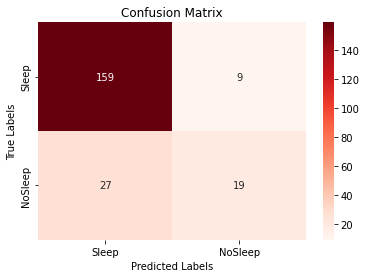

In [163]:
from sklearn.metrics import classification_report, confusion_matrix

cm=confusion_matrix(test_labels, stacking_pred, labels=[1,0])
ax=plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, cmap='Reds', fmt='d')
ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.xaxis.set_ticklabels(['Sleep','NoSleep'])
ax.yaxis.set_ticklabels(['Sleep','NoSleep'])

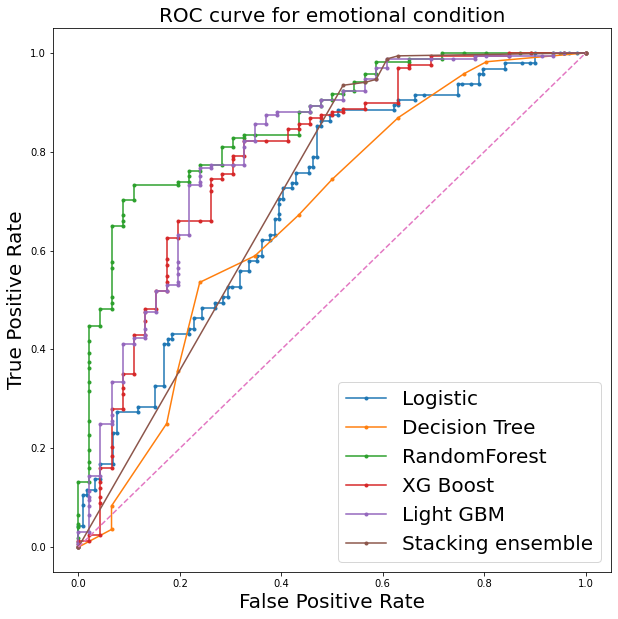

In [170]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(lr_fpr, lr_tpr, marker = '.', label = "Logistic")
plt.plot(dt_fpr, dt_tpr, marker = '.', label = "Decision Tree")
plt.plot(rf_fpr, rf_tpr, marker = '.', label = "RandomForest")
plt.plot(xgb_fpr, xgb_tpr, marker = '.', label = "XG Boost")
plt.plot(lgbm_fpr, lgbm_tpr, marker = '.', label = "Light GBM")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Stacking ensemble")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for emotional condition", size = 20)
plt.show()

In [810]:
logistic_regression_test

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [171]:
# Initialize the meta model
meta_model1 = LogisticRegression()
meta_model2 = LogisticRegression()
meta_model3 = LogisticRegression()
meta_model4 = LogisticRegression()
meta_model5 = LogisticRegression()

# Generate predictions from base models for training data
logistic_regression_pred_train = lr.predict(train_features)
decision_tree_pred_train = dt.predict(train_features)
random_forest_pred_train = rf.predict(train_features)
xgboost_pred_train = xgb.predict(train_features)
lgbm_pred_train = lgbm_best.predict(train_features)

# Create a meta-training dataset
meta_train_X1 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train))

meta_train_X2 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 lgbm_pred_train))

meta_train_X3 = np.column_stack((logistic_regression_pred_train,
                                 decision_tree_pred_train,
                                 
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X4 = np.column_stack((logistic_regression_pred_train,
                                 
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))

meta_train_X5 = np.column_stack((
                                 decision_tree_pred_train,
                                 random_forest_pred_train,
                                 xgboost_pred_train, lgbm_pred_train))


# Train the meta model on the meta-training dataset
meta_model1.fit(meta_train_X1, train_labels)
meta_model2.fit(meta_train_X2, train_labels)
meta_model3.fit(meta_train_X3, train_labels)
meta_model4.fit(meta_train_X4, train_labels)
meta_model5.fit(meta_train_X5, train_labels)

# Generate predictions from base models for testing data
logistic_regression_pred_test = lr.predict(test_features)
decision_tree_pred_test = dt.predict(test_features)
random_forest_pred_test = rf.predict(test_features)
xgboost_pred_test = xgb.predict(test_features)
lgbm_pred_test = lgbm_best.predict(test_features)

# Create a meta-testing dataset
meta_test_X1 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test))

meta_test_X2 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                lgbm_pred_test))

meta_test_X3 = np.column_stack((logistic_regression_pred_test,
                                decision_tree_pred_test,
                               
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X4 = np.column_stack((logistic_regression_pred_test,
                                
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

meta_test_X5 = np.column_stack((
                                decision_tree_pred_test,
                                random_forest_pred_test,
                                xgboost_pred_test, lgbm_pred_test))

# Make predictions using the stacking ensemble
stacking_pred1 = meta_model1.predict(meta_test_X1)

stacking_pred2 = meta_model2.predict(meta_test_X2)

stacking_pred3 = meta_model3.predict(meta_test_X3)

stacking_pred4 = meta_model4.predict(meta_test_X4)

stacking_pred5 = meta_model5.predict(meta_test_X5)

# Calculate accuracy score of stacking ensemble
accuracy1 = accuracy_score(test_labels, stacking_pred1)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy1 * 100))

accuracy2 = accuracy_score(test_labels, stacking_pred2)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy2 * 100))

accuracy3 = accuracy_score(test_labels, stacking_pred3)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy3 * 100))

accuracy4 = accuracy_score(test_labels, stacking_pred4)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy4 * 100))

accuracy5 = accuracy_score(test_labels, stacking_pred5)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy5 * 100))

y_pred_meta1 = meta_model1.predict_proba(meta_test_X1)[:, 1]
mt_fpr1, mt_tpr1, threshold1 = roc_curve(test_labels, y_pred_meta1)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta2 = meta_model2.predict_proba(meta_test_X2)[:, 1]
mt_fpr2, mt_tpr2, threshold1 = roc_curve(test_labels, y_pred_meta2)

roc_auc = auc(mt_fpr2, mt_tpr2)
print(roc_auc)

y_pred_meta3 = meta_model3.predict_proba(meta_test_X3)[:, 1]
mt_fpr3, mt_tpr3, threshold1 = roc_curve(test_labels, y_pred_meta3)

roc_auc = auc(mt_fpr3, mt_tpr3)
print(roc_auc)

y_pred_meta4 = meta_model4.predict_proba(meta_test_X4)[:, 1]
mt_fpr4, mt_tpr4, threshold1 = roc_curve(test_labels, y_pred_meta4)

roc_auc = auc(mt_fpr1, mt_tpr1)
print(roc_auc)

y_pred_meta5 = meta_model5.predict_proba(meta_test_X5)[:, 1]
mt_fpr5, mt_tpr5, threshold1 = roc_curve(test_labels, y_pred_meta5)

roc_auc = auc(mt_fpr5, mt_tpr5)
print(roc_auc)

Accuracy of stacking ensemble: 85.98%
Accuracy of stacking ensemble: 85.98%
Accuracy of stacking ensemble: 83.64%
Accuracy of stacking ensemble: 83.18%
Accuracy of stacking ensemble: 83.18%
0.7217261904761905
0.7507763975155279
0.7264492753623188
0.7217261904761905
0.7426242236024844


In [172]:
# Initialize the meta model
meta_model = LogisticRegression()

# Generate predictions from base models for training data
meta_model1_pred_train = meta_model1.predict(meta_train_X1)
meta_model2_pred_train = meta_model2.predict(meta_train_X2)
meta_model3_pred_train = meta_model3.predict(meta_train_X3)
meta_model4_pred_train = meta_model4.predict(meta_train_X4)
meta_model5_pred_train = meta_model5.predict(meta_train_X5)

# Create a meta-training dataset
meta_train_X = np.column_stack((meta_model1_pred_train,
                                 meta_model2_pred_train,
                                 meta_model3_pred_train,
                                 meta_model4_pred_train, meta_model5_pred_train))

# Train the meta model on the meta-training dataset
meta_model.fit(meta_train_X, train_labels)

# Generate predictions from base models for testing data
meta_model1_pred_test = meta_model1.predict(meta_test_X1)
meta_model2_pred_test = meta_model2.predict(meta_test_X2)
meta_model3_pred_test = meta_model3.predict(meta_test_X3)
meta_model4_pred_test = meta_model4.predict(meta_test_X4)
meta_model5_pred_test = meta_model5.predict(meta_test_X5)

# Create a meta-testing dataset
meta_test_X = np.column_stack((meta_model1_pred_test,
                                meta_model2_pred_test,
                                meta_model3_pred_test,
                                meta_model4_pred_test, meta_model5_pred_test))

# Make predictions using the stacking ensemble
stacking_pred = meta_model.predict(meta_test_X)

# Calculate accuracy score of stacking ensemble
accuracy = accuracy_score(test_labels, stacking_pred)
print("Accuracy of stacking ensemble: {:.2f}%".format(accuracy * 100))

y_pred_meta = meta_model.predict_proba(meta_test_X)[:, 1]
mt_fpr, mt_tpr, threshold1 = roc_curve(test_labels, y_pred_meta)

roc_auc = auc(mt_fpr, mt_tpr)
print(roc_auc)

Accuracy of stacking ensemble: 83.18%
0.7160973084886129


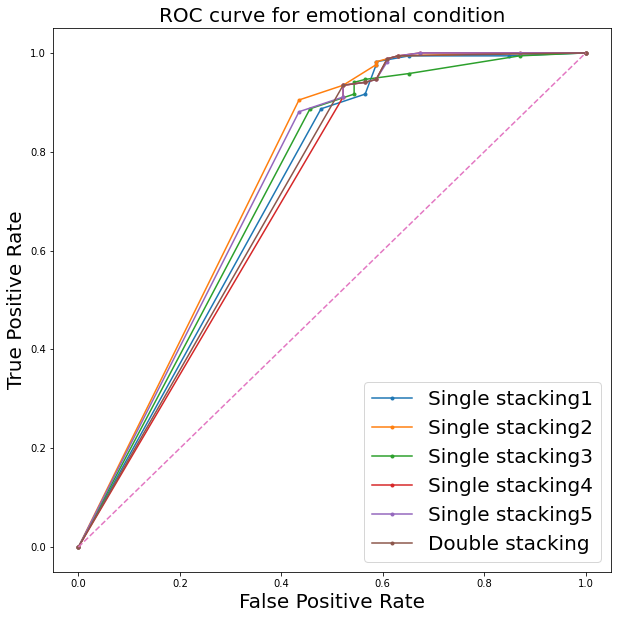

In [173]:
### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(mt_fpr1, mt_tpr1, marker = '.', label = "Single stacking1")
plt.plot(mt_fpr2, mt_tpr2, marker = '.', label = "Single stacking2")
plt.plot(mt_fpr3, mt_tpr3, marker = '.', label = "Single stacking3")
plt.plot(mt_fpr4, mt_tpr4, marker = '.', label = "Single stacking4")
plt.plot(mt_fpr5, mt_tpr5, marker = '.', label = "Single stacking5")
plt.plot(mt_fpr, mt_tpr, marker = '.', label = "Double stacking")
plt.plot(random_fpr, random_tpr, linestyle = '--')



plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve for emotional condition", size = 20)
plt.show()

In [67]:
train_features=pd.DataFrame(train_features, columns=feature.columns)

In [68]:
test_features=pd.DataFrame(test_features, columns=feature.columns)

In [69]:
model = LogisticRegression()
model.fit(train_features, train_labels)

LogisticRegression()

In [70]:
print(model.score(test_features, test_labels))

0.7897196261682243


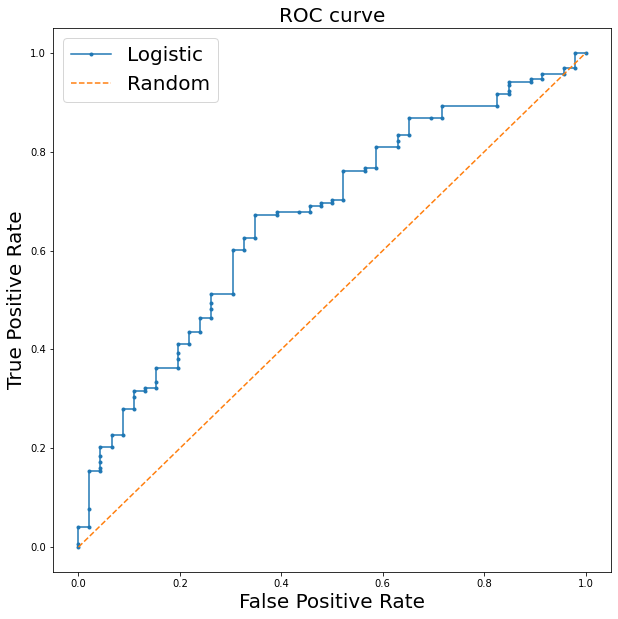



 ROC AUC score :  0.6683488612836439
[[168   0]
 [ 45   1]]
accuracy score: 0.7897196261682243
precision score: 0.7887323943661971
recall score: 1.0
f1 score: 0.8818897637795275
              precision    recall  f1-score   support

           0       1.00      0.02      0.04        46
           1       0.79      1.00      0.88       168

    accuracy                           0.79       214
   macro avg       0.89      0.51      0.46       214
weighted avg       0.83      0.79      0.70       214



In [71]:
### roc curve 패키지로 fpr, tpr 뽑기
y_pred=model.predict(test_features)
probs = model.predict_proba(test_features)[:,1]
model_fpr, model_tpr, threshold1 = roc_curve(test_labels, probs)

### 랜덤하게 했을때는 fpr, tpr 모두 0.5, 0.5로 나온다. 
random_fpr, random_tpr, threshold2 = roc_curve(test_labels, [0 for i in range(len(test_features))]) 

plt.figure(figsize = (10,10))
plt.plot(model_fpr, model_tpr, marker = '.', label = "Logistic")
plt.plot(random_fpr, random_tpr, linestyle = '--', label = "Random")

plt.xlabel("False Positive Rate", size = 20)
plt.ylabel("True Positive Rate", size = 20)

plt.legend(fontsize = 20)

plt.title("ROC curve", size = 20)
plt.show()


### AUC 값 확인하기 (ROC curve 아래 부분 면적)
roc_auc = auc(model_fpr, model_tpr)
print("\n\n ROC AUC score : ", roc_auc)
print(confusion_matrix(test_labels, y_pred, labels=[1,0]))
print('accuracy score:', accuracy_score(test_labels, y_pred))
print('precision score:',precision_score(test_labels, y_pred, pos_label=1))
print('recall score:', recall_score(test_labels, y_pred, pos_label=1))
print('f1 score:', f1_score(test_labels, y_pred, pos_label=1))
print(classification_report(test_labels, y_pred))